In [1]:
import pandas as pd
import glob

import numpy as np
import datetime

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn import metrics

import warnings
warnings.filterwarnings("ignore")

# Clustering

In [3]:
filename = glob.glob('../*.csv')
df = pd.read_csv(filename[0])

df = df.iloc[:, :5]
df.drop(columns=['machine', 'timestamp'], inplace=True)

df = df.pivot_table('value', 'packet_timestamp', 'id')

df.index = df.index.astype(str).str[:-3].astype(np.int64)
df['date'] = df.index.map(lambda timestamp: datetime.datetime.fromtimestamp(timestamp))
df = df.set_index('date')
df.drop(columns=['ApplicationTime', 'PartCode', 'PressureAvg_d2',
                 'PressureMax_d2', 'CycleTime', 'PressureAvg_d1', 
                 'TorqueAvg_d1', 'TorqueAvg_d2', 'VolumeCurrent', 
                 'VolumeDeviation', 'VolumeSet'], inplace=True)

df.head()

id,PressureMax_d1
date,
2021-03-14 14:34:07,109.0
2021-03-14 17:02:51,109.0
2021-03-14 17:03:50,103.0
2021-03-14 17:04:58,101.0
2021-03-14 17:15:11,104.0


# Kmeans

In [3]:
from sklearn.cluster import KMeans

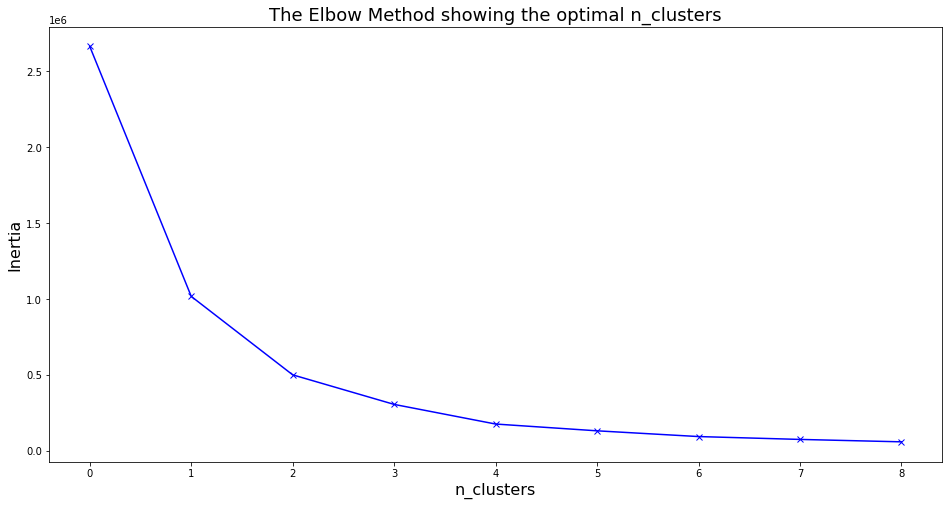

In [4]:
def elbow_method():
    wcss = [KMeans(n_clusters=k).fit(df).inertia_ for k in range(1, 10)]
    plt.figure(figsize=(16,8))
    plt.plot(wcss, 'bx-')
    plt.xlabel('n_clusters', fontsize=16)
    plt.ylabel('Inertia', fontsize=16)
    plt.title('The Elbow Method showing the optimal n_clusters', fontsize=18)
    # plt.savefig('kmeans_elbow.png', bbox_inches='tight')
    return plt.show()
elbow_method()

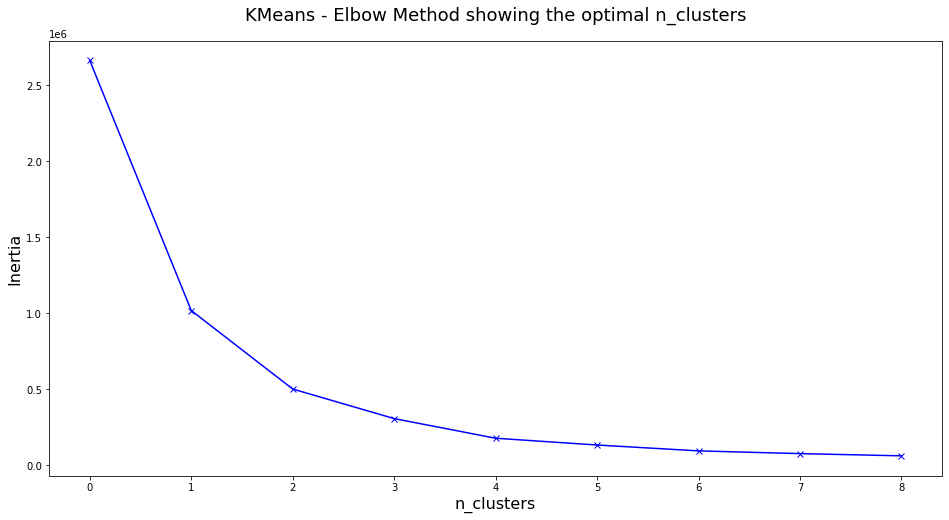

In [39]:
wcss = [KMeans(n_clusters=k).fit(df).inertia_ for k in range(1, 10)]
plt.figure(figsize=(16,8))
plt.plot(wcss, 'bx-')
plt.xlabel('n_clusters', fontsize=16)
plt.ylabel('Inertia', fontsize=16)
plt.title('KMeans - Elbow Method showing the optimal n_clusters', fontsize=18, pad=20)

In [6]:
silhouette_score = []
n_clusters = []

In [7]:
data = df.copy()

In [8]:
for n_cluster in range(2, 7):
    kmeans = KMeans(n_clusters=n_cluster, random_state=1)
    kmeans.fit(data)
    y_kmeans = kmeans.predict(data)
    data['target'] = kmeans.labels_
    metrics.silhouette_score(data, kmeans.labels_, metric='euclidean')
    n_clusters.append(n_cluster)
    silhouette_score.append(metrics.silhouette_score(data, kmeans.labels_, metric='euclidean'))

In [9]:
kmeans_score = pd.DataFrame(columns=['n_clusters', 'silhouette_score'])
kmeans_score['n_clusters'] = n_clusters
kmeans_score['silhouette_score'] = silhouette_score
kmeans_score

,n_clusters,silhouette_score
0,2,0.566858
1,3,0.597413
2,4,0.628253
3,5,0.639442
4,6,0.639944


In [10]:
n_cluster = 3

In [11]:
kmeans = KMeans(n_clusters=n_cluster, random_state=1)
kmeans.fit(data)
y_kmeans = kmeans.predict(data)
data['target'] = kmeans.labels_
data.head()

id,PressureMax_d1,target
date,,
2021-03-14 14:34:07,109.0,1
2021-03-14 17:02:51,109.0,1
2021-03-14 17:03:50,103.0,1
2021-03-14 17:04:58,101.0,1
2021-03-14 17:15:11,104.0,1


In [12]:
metrics.silhouette_score(data, kmeans.labels_, metric='euclidean')

0.5993862742278377

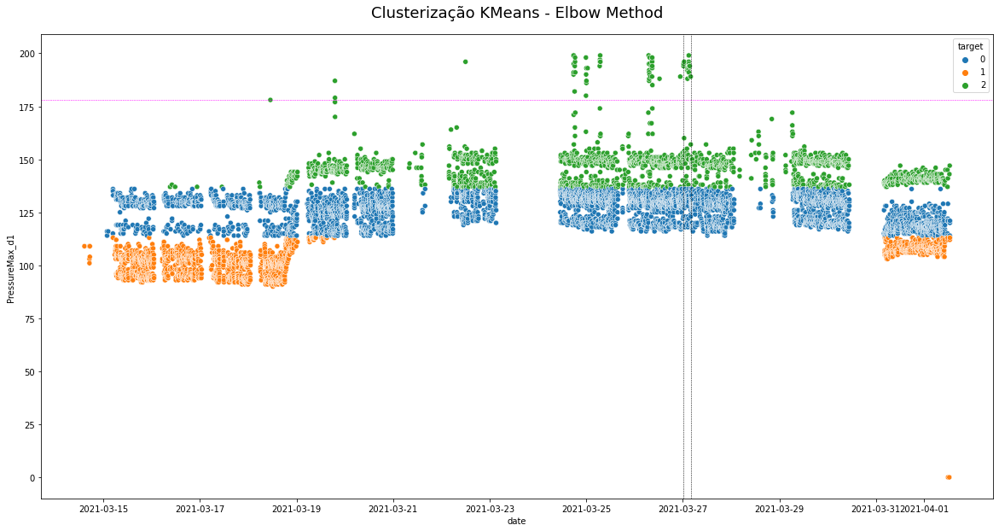

In [13]:
for col in data.columns[:-1]:
    plt.figure(figsize=(20, 10))
    plt.title('Clusterização KMeans - Elbow Method', fontsize=18, pad=20)
    sns.scatterplot(x=data.index, y=data[col], hue=data.target, palette='tab10');
    plt.axhline(y=178, color='magenta', linestyle='--', lw = 0.5)
    plt.axvline(x=datetime.datetime(2021, 3, 27, 0, 3, 0), color='k', linestyle='--', lw = 0.5)
    plt.axvline(x=datetime.datetime(2021, 3, 27, 3, 53, 0), color='k', linestyle='--', lw = 0.5)

## AgglomerativeClustering

In [14]:
import datetime

In [15]:
from sklearn.cluster import AgglomerativeClustering

In [16]:
agglo = df.copy()

In [17]:
silhouette_score = []
n_clusters = []

In [18]:
for n_cluster in range(2, 7): 
    clustering = AgglomerativeClustering(n_clusters=n_cluster, linkage='single', distance_threshold=None)
    clustering.fit(agglo)
    agglo['target'] = clustering.labels_
    agglo_labels = clustering.labels_
    metrics.silhouette_score(agglo, agglo_labels, metric='euclidean')
    n_clusters.append(n_cluster)
    silhouette_score.append(metrics.silhouette_score(agglo, agglo_labels, metric='euclidean'))

In [19]:
agglo_score = pd.DataFrame(columns=['n_clusters', 'silhouette_score'])
agglo_score['n_clusters'] = n_clusters
agglo_score['silhouette_score'] = silhouette_score
agglo_score

,n_clusters,silhouette_score
0,2,0.850226
1,3,0.727429
2,4,0.643890
3,5,0.637452
4,6,0.600634


In [20]:
n_cluster = 2

In [21]:
clustering = AgglomerativeClustering(n_clusters=n_cluster, linkage='single', distance_threshold=None)
clustering.fit(agglo)

AgglomerativeClustering(linkage='single')

In [22]:
agglo['target'] = clustering.labels_
agglo.head()

id,PressureMax_d1,target
date,,
2021-03-14 14:34:07,109.0,0
2021-03-14 17:02:51,109.0,0
2021-03-14 17:03:50,103.0,0
2021-03-14 17:04:58,101.0,0
2021-03-14 17:15:11,104.0,0


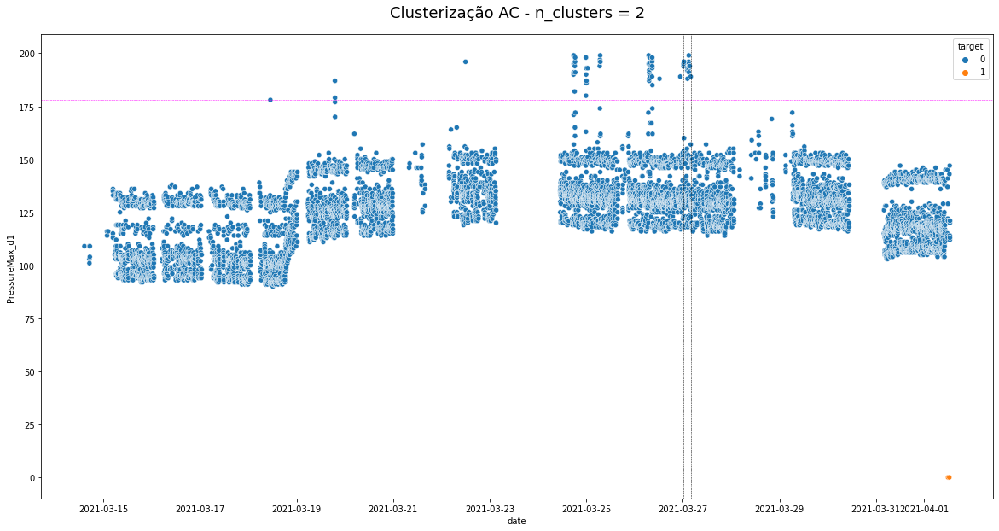

In [23]:
for col in agglo.columns[:-1]:
    plt.figure(figsize=(20, 10))
    plt.title('Clusterização AC - n_clusters = 2', fontsize=18, pad=20)
    sns.scatterplot(x=agglo.index, y=agglo[col], hue=agglo.target, palette='tab10');
    plt.axhline(y=178, color='magenta', linestyle='--', lw = 0.5)
    plt.axvline(x=datetime.datetime(2021, 3, 27, 0, 3, 0), color='k', linestyle='--', lw = 0.5)
    plt.axvline(x=datetime.datetime(2021, 3, 27, 3, 53, 0), color='k', linestyle='--', lw = 0.5)

# Mean Shift

In [24]:
from sklearn.cluster import MeanShift
from sklearn.cluster import estimate_bandwidth

In [25]:
X = df.copy()

In [26]:
for i in range(1, 10):
    i = float(i / 10)
    BW = estimate_bandwidth(X, quantile=i, random_state=1)
    mean_shift = MeanShift(bandwidth=BW).fit(X)
    print('quantile: {} BW: {} sc: {} n_clusters: {}'.format(i, BW, metrics.silhouette_score(X, mean_shift.labels_, metric='euclidean'), mean_shift.labels_.max() + 1))

quantile: 0.1 BW: 3.4746302382908794 sc: 0.5313842942609694 n_clusters: 18
quantile: 0.2 BW: 7.150883319638456 sc: 0.5661302438984412 n_clusters: 6
quantile: 0.3 BW: 10.629827444535744 sc: 0.42374951244722514 n_clusters: 5
quantile: 0.4 BW: 13.323952341824159 sc: 0.6816105379825969 n_clusters: 3
quantile: 0.5 BW: 16.519926047658174 sc: 0.6816105379825969 n_clusters: 3
quantile: 0.6 BW: 19.711483155299916 sc: 0.6816105379825969 n_clusters: 3
quantile: 0.7 BW: 23.04878800328677 sc: 0.5659614501699363 n_clusters: 3
quantile: 0.8 BW: 29.1392769104355 sc: 0.8502201183162822 n_clusters: 2
quantile: 0.9 BW: 36.17481511914544 sc: 0.8502201183162822 n_clusters: 2


In [27]:
BW = estimate_bandwidth(X, quantile=0.4, random_state=1)
mean_shift = MeanShift(bandwidth=BW).fit(X)
metrics.silhouette_score(X, mean_shift.labels_, metric='euclidean')

0.6816105379825969

In [28]:
X['target'] = mean_shift.labels_
X.head()

id,PressureMax_d1,target
date,,
2021-03-14 14:34:07,109.0,0
2021-03-14 17:02:51,109.0,0
2021-03-14 17:03:50,103.0,0
2021-03-14 17:04:58,101.0,0
2021-03-14 17:15:11,104.0,0


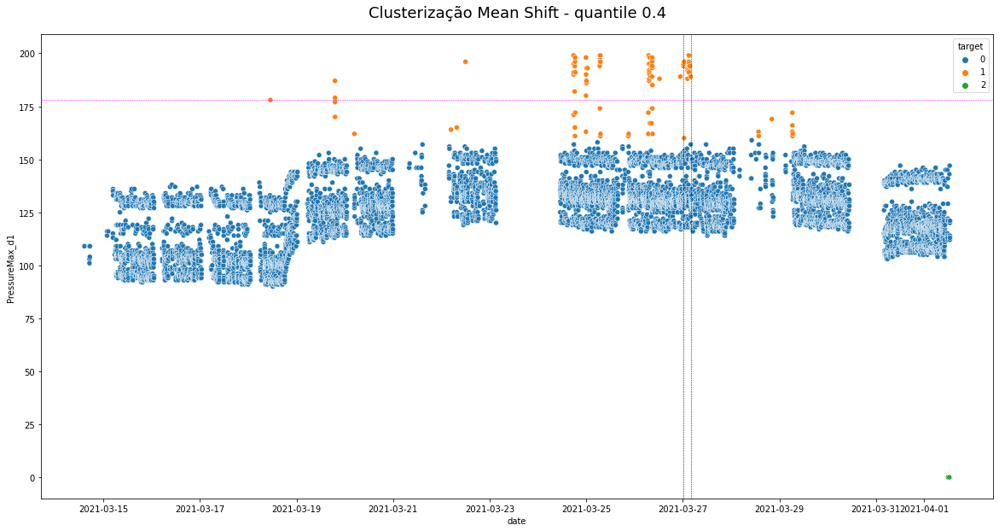

In [29]:
for col in X.columns[:-1]:
    plt.figure(figsize=(20, 10))
    plt.title('Clusterização Mean Shift - quantile 0.4', fontsize=18, pad=20)
    sns.scatterplot(x=X.index, y=X[col], hue=X.target, palette='tab10');
    plt.axhline(y=178, color='magenta', linestyle='--', lw = 0.5)
    plt.axvline(x=datetime.datetime(2021, 3, 27, 0, 3, 0), color='k', linestyle='--', lw = 0.5)
    plt.axvline(x=datetime.datetime(2021, 3, 27, 3, 53, 0), color='k', linestyle='--', lw = 0.5)

In [30]:
ms_score = pd.DataFrame(columns=['n_clusters', 'silhouette_score'])
ms_score['n_clusters'] = [mean_shift.labels_.max() + 1]
ms_score['silhouette_score'] = [metrics.silhouette_score(X, mean_shift.labels_, metric='euclidean')]
ms_score

,n_clusters,silhouette_score
0,3,0.681697


In [31]:
BW = estimate_bandwidth(X, quantile=0.6, random_state=1)
mean_shift = MeanShift(bandwidth=BW).fit(X)
metrics.silhouette_score(X, mean_shift.labels_, metric='euclidean')

0.681696868757575

In [32]:
X['target'] = mean_shift.labels_
X.head()

id,PressureMax_d1,target
date,,
2021-03-14 14:34:07,109.0,0
2021-03-14 17:02:51,109.0,0
2021-03-14 17:03:50,103.0,0
2021-03-14 17:04:58,101.0,0
2021-03-14 17:15:11,104.0,0


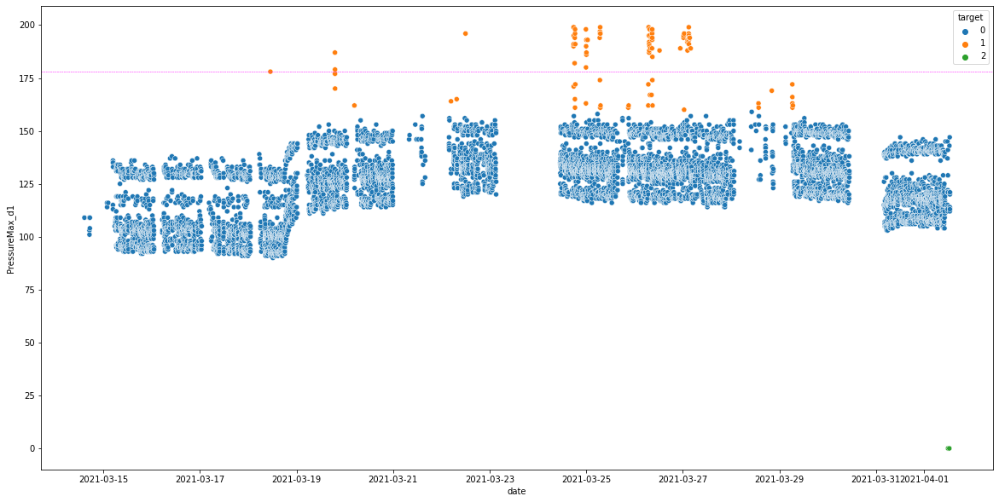

In [33]:
for col in X.columns[:-1]:
    plt.figure(figsize=(20, 10))
    sns.scatterplot(x=X.index, y=X[col], hue=X.target, palette='tab10');
    plt.axhline(y=178, color='magenta', linestyle='--', lw = 0.5)

In [34]:
ms_score = pd.DataFrame(columns=['n_clusters', 'silhouette_score'])
ms_score['n_clusters'] = [mean_shift.labels_.max() + 1]
ms_score['silhouette_score'] = [metrics.silhouette_score(X, mean_shift.labels_, metric='euclidean')]
ms_score

,n_clusters,silhouette_score
0,3,0.681697


In [35]:
BW = estimate_bandwidth(X, quantile=0.8, random_state=1)
mean_shift = MeanShift(bandwidth=BW).fit(X)
metrics.silhouette_score(X, mean_shift.labels_, metric='euclidean')

0.8502404597620786

In [36]:
X['target'] = mean_shift.labels_
X.head()

id,PressureMax_d1,target
date,,
2021-03-14 14:34:07,109.0,0
2021-03-14 17:02:51,109.0,0
2021-03-14 17:03:50,103.0,0
2021-03-14 17:04:58,101.0,0
2021-03-14 17:15:11,104.0,0


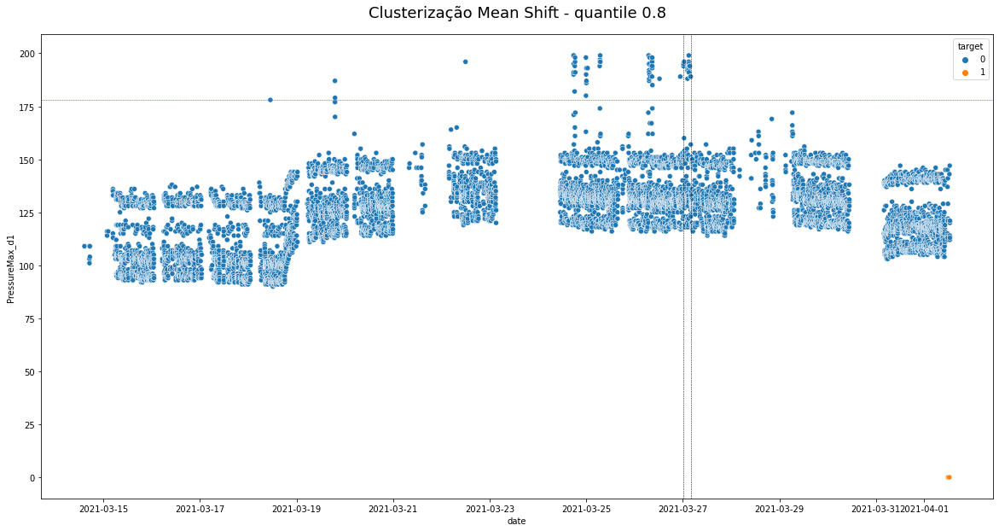

In [37]:
for col in X.columns[:-1]:
    plt.figure(figsize=(20, 10))
    plt.title('Clusterização Mean Shift - quantile 0.8', fontsize=18, pad=20)
    sns.scatterplot(x=X.index, y=X[col], hue=X.target, palette='tab10');
    plt.axhline(y=178, color='magenta', linestyle='--', lw = 0.5)
    plt.axvline(x=datetime.datetime(2021, 3, 27, 0, 3, 0), color='k', linestyle='--', lw = 0.5)
    plt.axvline(x=datetime.datetime(2021, 3, 27, 3, 53, 0), color='k', linestyle='--', lw = 0.5)
    # plt.savefig('ms8.jpeg', bbox_inches='tight', dpi=300)

In [38]:
ms_score = pd.DataFrame(columns=['n_clusters', 'silhouette_score'])
ms_score['n_clusters'] = [mean_shift.labels_.max() + 1]
ms_score['silhouette_score'] = [metrics.silhouette_score(X, mean_shift.labels_, metric='euclidean')]
ms_score

,n_clusters,silhouette_score
0,2,0.850226
